# Proyecto: revisión de los crímenes […]

## Emiliano Robledo Ibarra


Para este proyecto se utilizó la base de datos de los crímenes ocurridos en Chicago de 2001 a 2017 [Crimes in Chicago](https://www.kaggle.com/currie32/crimes-in-chicago/version/1?select=Chicago_Crimes_2012_to_2017.csv) y el shapefile de [Mapa de los distritos de Chicago](https://data.cityofchicago.org/Public-Safety/Boundaries-Police-Beats-current-/aerh-rz74)

Los datos usados son registros oficiales proporcionados por parte del cuerpo policial de la ciudad de Chicago, Illinois. En ellos se recabó cierta información tal como la fecha (Date), locación (Block, Location Description, District, Latitude, Longitude, Location) y una descripción del crimen cometido (Primary Type, Description, Arrest). Como no resulta ser una red sino una base de datos podemos analizar de distintas formas los datos elegidos, no obstante, una constante en cualquier análisis será siempre que __cada nodo corresponderá a un crimen reportado ante las autoridades de Chicago__

## 1. Datos

Comenzaremos leyendo y observando los datos que podremos usar para los análisis.

In [1]:
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import numpy as np
import networkx as nx
import osmnx as ox

En primera instancia podemos seleccionar distintos tipos de relaciones según las columnas que elijamos, puede ser por el tipo del crimen o por la ubicación o si fue arrestado el criminal.

In [2]:
pd.read_csv('Chicago Crimes/Chicago_Crimes_2001_to_2004.csv', nrows = 10,sep = ',').columns

Index(['Unnamed: 0', 'ID', 'Case Number', 'Date', 'Block', 'IUCR',
       'Primary Type', 'Description', 'Location Description', 'Arrest',
       'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'FBI Code',
       'X Coordinate', 'Y Coordinate', 'Year', 'Updated On', 'Latitude',
       'Longitude', 'Location'],
      dtype='object')

Y la base de datos tiene un aspecto similar al siguiente

In [3]:
pd.read_csv('Chicago Crimes/Chicago_Crimes_2001_to_2004.csv',sep = ',', skiprows=[1513590])#['Location Description'].unique()

/Users/robledito/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (17,20) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,879,4786321,HM399414,01/01/2004 12:01:00 AM,082XX S COLES AVE,0840,THEFT,FINANCIAL ID THEFT: OVER $300,RESIDENCE,False,...,7.0,46.0,06,NaN,NaN,2004.0,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,2544,4676906,HM278933,03/01/2003 12:00:00 AM,004XX W 42ND PL,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,RESIDENCE,False,...,11.0,61.0,26,1173974.0,1876757.0,2003.0,04/15/2016 08:55:02 AM,41.817229,-87.637328,"(41.817229156, -87.637328162)"
2,2919,4789749,HM402220,06/20/2004 11:00:00 AM,025XX N KIMBALL AVE,1752,OFFENSE INVOLVING CHILDREN,AGG CRIM SEX ABUSE FAM MEMBER,RESIDENCE,False,...,35.0,22.0,20,NaN,NaN,2004.0,08/17/2015 03:03:40 PM,NaN,NaN,NaN
3,2927,4789765,HM402058,12/30/2004 08:00:00 PM,045XX W MONTANA ST,0840,THEFT,FINANCIAL ID THEFT: OVER $300,OTHER,False,...,31.0,20.0,06,NaN,NaN,2004.0,08/17/2015 03:03:40 PM,NaN,NaN,NaN
4,3302,4677901,HM275615,05/01/2003 01:00:00 AM,111XX S NORMAL AVE,0841,THEFT,FINANCIAL ID THEFT:$300 &UNDER,RESIDENCE,False,...,34.0,49.0,06,1174948.0,1831051.0,2003.0,04/15/2016 08:55:02 AM,41.691785,-87.635116,"(41.691784636, -87.635115968)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1923510,6252586,4781176,HM386461,04/01/2001 09:00:00 AM,023XX N LATROBE AVE,0841,THEFT,FINANCIAL ID THEFT:$300 &UNDER,ALLEY,False,...,37.0,19.0,06,1140960.0,1915056.0,2001.0,06/14/2006 04:14:16 AM,41.922997,-87.757492,"(41.922996623, -87.757491503)"
1923511,6252606,4671197,HM270817,09/01/2003 12:01:00 AM,045XX N MOBILE AVE,0840,THEFT,FINANCIAL ID THEFT: OVER $300,APARTMENT,False,...,38.0,15.0,06,1133528.0,1929634.0,2003.0,04/15/2016 08:55:02 AM,41.963134,-87.784457,"(41.963133955, -87.784456675)"
1923512,6252728,4671380,HM269330,08/01/2002 09:00:00 AM,020XX W 82ND PL,0840,THEFT,FINANCIAL ID THEFT: OVER $300,RESIDENCE,False,...,18.0,71.0,06,1164056.0,1849944.0,2002.0,04/15/2016 08:55:02 AM,41.743865,-87.674464,"(41.743865444, -87.674463733)"
1923513,6253372,4782588,HM394550,06/04/2001 12:01:00 AM,087XX S MUSKEGON AVE,0610,BURGLARY,FORCIBLE ENTRY,OTHER,False,...,10.0,46.0,05,1196570.0,1847474.0,2001.0,07/05/2006 04:01:36 AM,41.736343,-87.555413,"(41.736342659, -87.555413094)"


Nos fijamos en las columnas del tipo de delito, año y detalles del lugar.

In [4]:
pd.read_csv('Chicago Crimes/Chicago_Crimes_2001_to_2004.csv',
            #nrows = 10,
            sep = ',',
            skiprows=[1513590],
            usecols = ['Primary Type','Location Description','Year','Latitude', 'Longitude', 'Location']
           ).dropna()

/Users/robledito/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (20) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Primary Type,Location Description,Year,Latitude,Longitude,Location
1,OTHER OFFENSE,RESIDENCE,2003.0,41.817229,-87.637328,"(41.817229156, -87.637328162)"
4,THEFT,RESIDENCE,2003.0,41.691785,-87.635116,"(41.691784636, -87.635115968)"
6,CRIM SEXUAL ASSAULT,RESIDENCE,2001.0,41.68702,-87.608445,"(41.687020002, -87.60844523)"
7,OTHER OFFENSE,RESIDENCE PORCH/HALLWAY,2003.0,41.729712,-87.653159,"(41.729712374, -87.653158513)"
9,THEFT,RESIDENCE,2003.0,41.869772,-87.708180,"(41.869772159, -87.708180162)"
...,...,...,...,...,...,...
1923510,THEFT,ALLEY,2001.0,41.922997,-87.757492,"(41.922996623, -87.757491503)"
1923511,THEFT,APARTMENT,2003.0,41.963134,-87.784457,"(41.963133955, -87.784456675)"
1923512,THEFT,RESIDENCE,2002.0,41.743865,-87.674464,"(41.743865444, -87.674463733)"
1923513,BURGLARY,OTHER,2001.0,41.736343,-87.555413,"(41.736342659, -87.555413094)"


De manera que nuestra red tendrá como enlaces un crimen y dependiendo de la elección que hagamos, el nodo será una característica del crimen.

## 2. Visualización de los crímenes

Para poder observar los crímenes ocurridos, según su localización, invocar la paquetería de geopandas

In [5]:
import osmnx as ox
import geopandas as gpd

Para localizar a Chicago importamos un shapefile

In [6]:
street_map = gpd.read_file('Mapa Chicago/Chicago_city.shp') 

Y luego elegimos la base para limpiarla y selecciónar que datos queremos representar

In [7]:
df = pd.read_csv('Chicago Crimes/Chicago_Crimes_2001_to_2004.csv',
            #nrows = 10,
            sep = ',',
            usecols = ['Primary Type','Block','Location Description','Year','Latitude', 'Longitude', 'Location']
           ).dropna()

df = df.reset_index().drop('index', axis = 1).drop(1490020) # Corrección de un renglón
df = df[pd.to_numeric(df['Latitude']) > 41]          # Corrección de un dato
#df = df[df['Year'] == 2003] # Para ver los crímenes con un filtro de año


geo_df = gpd.GeoDataFrame(zip(df['Longitude'],df['Latitude']))

/Users/robledito/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (18,20,21) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


Luego de haber generado el dataframe a usar los graficamos sobre el contorno de la ciudad

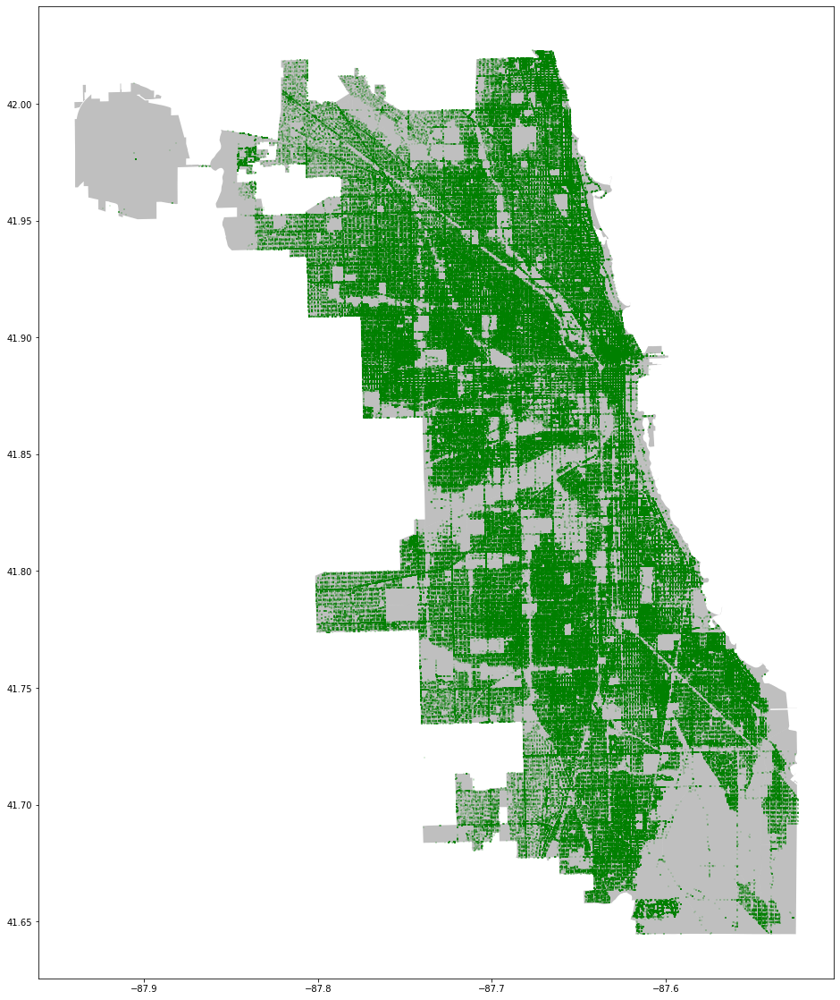

In [8]:
fig, ax = plt.subplots(figsize = (20,20))
street_map.plot(ax = ax, alpha = 0.25, color = 'k')
ax.scatter(df['Longitude'],df['Latitude'], alpha= 0.1, c='g', marker=',', s=1)

Lo cual nos muestra cierta forma del arreglo de la ciudad.

## 3. Red de crímenes.

### 3.1 Proyección (crimen, cuadra)

El registro de crímenes, al contar con tantos registros y columnas nos da mucha libertad sobre como crear una red, en principio esta debe ser bipartita para casi todo método que querramos usar. Como una primer propuesta tenemos a una red bipartita que une el tipo de crimen (primera clasificación) y la cuadra donde ocurrió.

In [9]:
from networkx.algorithms import bipartite

G = nx.Graph()     # Creamos una gráfica

G.add_nodes_from( df["Primary Type"] , bipartite = 0 ) # Asignamos como primer propiedad el crimen
G.add_nodes_from( list(df.Block) , bipartite = 1 ) # Asignamos como segunda propiedad la cuadra
enlaces = zip(df["Primary Type"], df.Block) # Juntamos ambos valores (crimen, cuadra)
G.add_edges_from(enlaces)  # Agregamos los enlaces

Habiendo generado la gráfica y los enlaces notamos que cada crimen puede repetirse al igual que la locación, entonces, para asegurarnos que no se repitan ningúno de los dos usaremos conjuntos para definir los delitos y las cuadras.

In [10]:
delito = {n for n, d in G.nodes(data = True) if d['bipartite'] == 0 }
cuadra = set(G) - delito

Una vez limpiado la red la proyectamos sobre los delitos: si varios delitos se cometieron en la misma cuadra entonces estos tendrán un enlace.

In [11]:
G = bipartite.projected_graph(G, delito)
print(G)

Graph with 30 nodes and 411 edges


Con la red lista podemos visualizarla

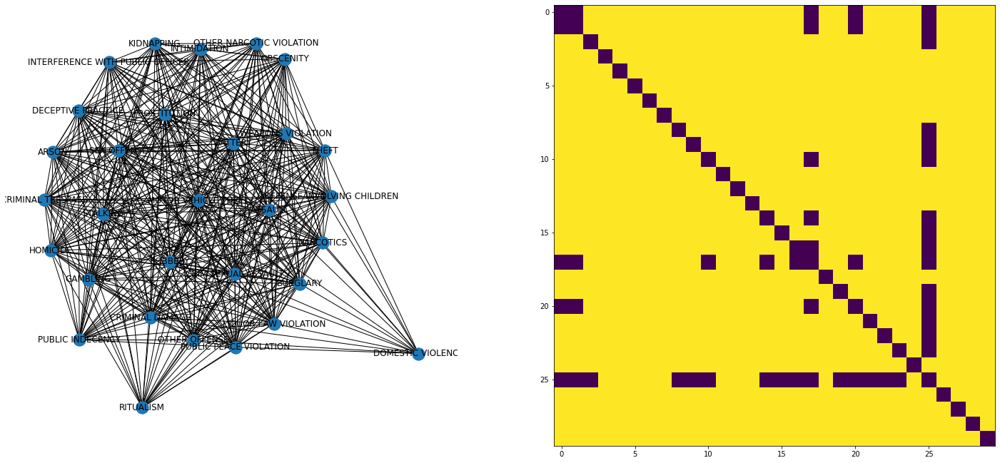

In [12]:
plt.figure(figsize = [25,25])

plt.subplot(221)
nx.draw_kamada_kawai(G, with_labels = True)

plt.subplot(222)
plt.imshow(nx.to_numpy_array(G))

In [13]:
G.degree()

DegreeView({'OBSCENITY': 25, 'OTHER NARCOTIC VIOLATION': 25, 'PROSTITUTION': 28, 'CRIM SEXUAL ASSAULT': 29, 'WEAPONS VIOLATION': 29, 'NARCOTICS': 29, 'BATTERY': 29, 'MOTOR VEHICLE THEFT': 29, 'SEX OFFENSE': 28, 'STALKING': 28, 'INTIMIDATION': 27, 'OFFENSE INVOLVING CHILDREN': 29, 'ASSAULT': 29, 'ROBBERY': 29, 'KIDNAPPING': 27, 'CRIMINAL TRESPASS': 28, 'INTERFERENCE WITH PUBLIC OFFICER': 27, 'RITUALISM': 22, 'CRIMINAL DAMAGE': 29, 'DECEPTIVE PRACTICE': 28, 'PUBLIC INDECENCY': 25, 'ARSON': 28, 'GAMBLING': 28, 'HOMICIDE': 28, 'OTHER OFFENSE': 29, 'DOMESTIC VIOLENCE': 14, 'PUBLIC PEACE VIOLATION': 29, 'LIQUOR LAW VIOLATION': 29, 'THEFT': 29, 'BURGLARY': 29})

Como esperabamos la base de datos tiene tantas entradas que el tipo de delito será rebasado en número de manera tal que prácticamente casi todo delito ha ocurrido en toda cuadra. 

Dado que no podemos extraer mucha información de la red, pensaremos en otra proyección.

### 3.2 Proyección (crimen, lugar)

Otro tipo de proyección que podemos pensar es sobre los lugares donde ocurren usando los crímenes como segundo conjunto. Repetimos el proceso antes creado para las columnas _Primary type_ y _Location Description_.

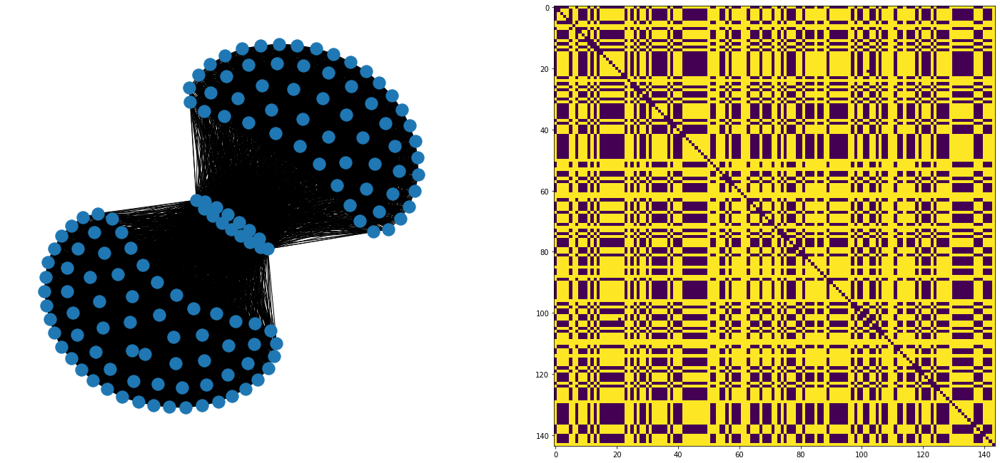

In [14]:
import networkx as nx
from networkx.algorithms import bipartite

G2 = nx.Graph()     # Creamos una gráfica

G2.add_nodes_from( df["Primary Type"] , bipartite = 0 ) # Asignamos como primer propiedad el país
G2.add_nodes_from( df['Location Description'] , bipartite = 1 ) # Asignamos como segunda propiedad el producto
enlaces = zip(df["Primary Type"], df['Location Description']) # Juntamos ambos valores (país, producto)
G2.add_edges_from(enlaces)  # Agregamos los enlaces

delito = {n for n, d in G.nodes(data = True) if d['bipartite'] == 0 }
lugar = set(G2) - delito

G2 = bipartite.projected_graph(G2, lugar)

plt.figure(figsize = [25,25])

plt.subplot(221)
nx.draw_kamada_kawai(G2, with_labels = False)

plt.subplot(222)
plt.imshow(nx.to_numpy_array(G2))

Podemos, entonces, agrandar la representación gráfica que conseguimos

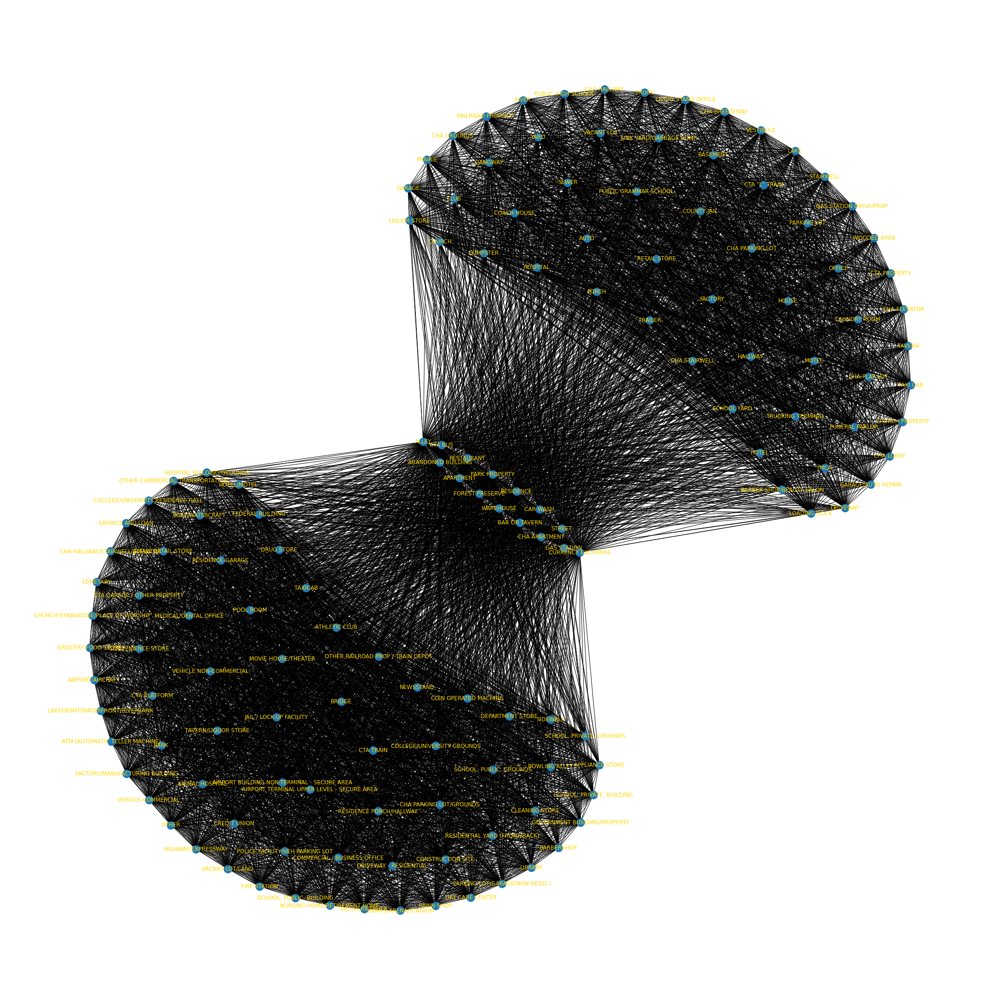

In [15]:
plt.figure(figsize = [30,30])

nx.draw_kamada_kawai(G2, with_labels = True, font_color="gold")

Obteniendo una red más atractiva, nos fijamos en ella. Podemos describirla para poder extraer información de ella, en resumen y como una última mención a su estructura recordemos __que cada nodo es un lugar en la ciudad__: la calle, una tienda, un hotel, una escuela, el aeropuerto, entre otros. Y estos lugares tienen una relación entre sí cuando en ambos ocurrió el mismo tipo de crimen: asalto, homicidio, indecencia pública, incendiarismo o cualquier otro crimen.

#### 3.2.1 Análisis gráfico de la red.

En la representación gráfica anterior podemos distinguir varias características interesantes, la primera y más notoria es que la red se encuentra segmentada en dos grupos muy grandes que abarcan prácticamente la totalidad de los nodos en la red y estos dos grupos se unen mediante ciertas locaciones. Al revisar cada grupo y el nombre de los nodos notamos que existe un patrón, que, aunque no es tan significativo, representa un primer acercamiento al entendimiento de la red. 

Cuando observamos el tipo de locaciones que tenemos concentradas en el lóbulo izquierdo de la red, estas en gran medida se caracterizan por alguno de los dos aspectos: son muy transitados (_sidewalk, ATM, bank_) o se encuentran vigilados la mayor parte del tiempo. Y los nodos de la parte derecha muchos se caracterizan por estar sin vigilancia y/o ser de difícil acceso por ser privados (_wooded area, factory, basement_). Los dos aspectos anteriores nos dejan con una posible hipótesis sobre el tipo de crimen que es más fácil cometer según la locación y de hecho podemos ver las comunidades de dicha red.



In [16]:
from networkx.algorithms.community import greedy_modularity_communities

comunidades = list(greedy_modularity_communities(G2))
len(comunidades)

2

En donde encontramos dos grandes comunidades, tal como observamos en un principio. 

Otro aspecto en el cual podemos fijarnos es en los principales lugares donde ocurren crímenes y reportes policiacos que vienen a nosotros por mera intuición; lugares donde la gente pasa mucho tiempo como en la calle o en casa pero también aquellos donde no hay nadie en absoluto como edificios abandonados o bosques. 

Entonces, como segundo aspecto a verficar en la gráfica, podemos analizar la centralidad de los nodos de la red y comprobar que tan cierto es el hecho que donde ocurren la mayor cantidad de crímenes es en los espacios cotidianos y los aislados.

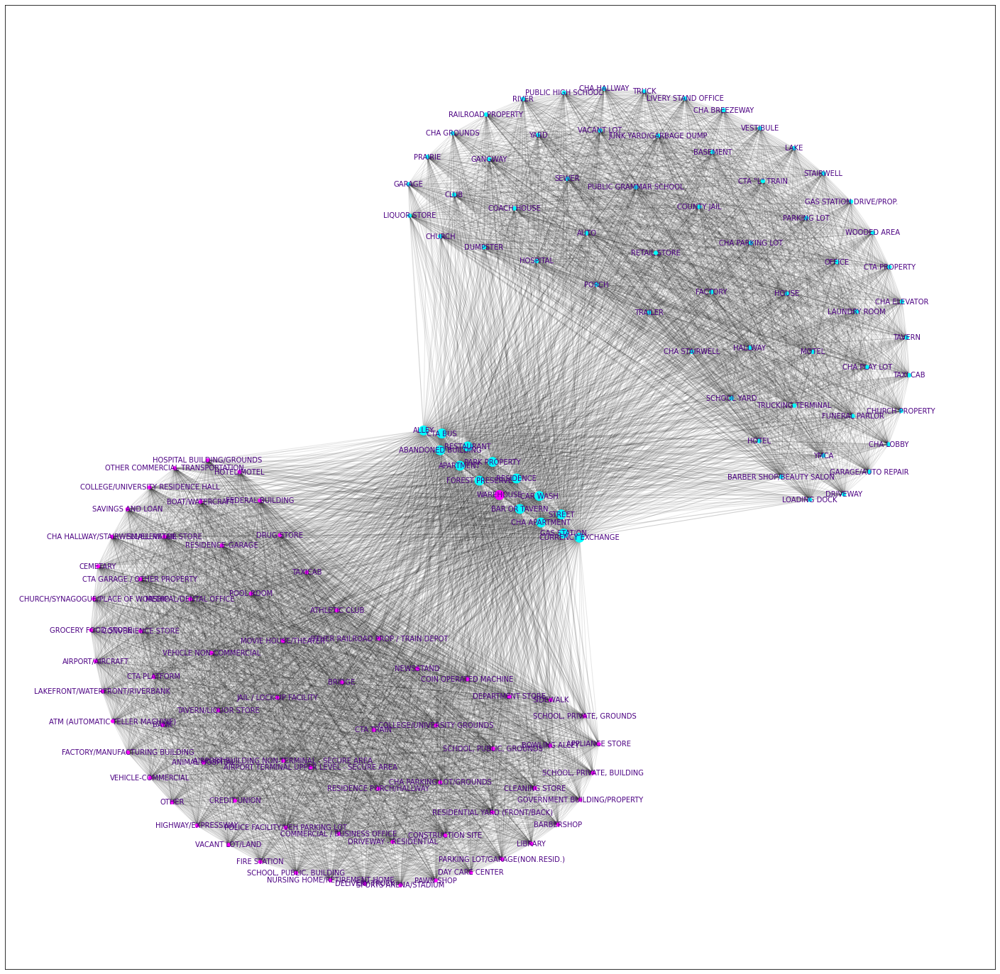

In [17]:
diccionario = {}

for i, comunidad in enumerate(comunidades): #visita cada comunidad
    for nodo in comunidad: #visita cada nodo de la comunidad
        diccionario[nodo] = i 
        
colors = np.array([diccionario[i] for i in G2 ])

sizes = np.array([nx.katz_centrality_numpy(G2)[i] for i in G2])

plt.figure(figsize = [25,25] )

nx.drawing.nx_pylab.draw_networkx_labels(G2, pos = nx.kamada_kawai_layout(G2),
                                         font_size = 10, font_color="indigo") # Colocamos los enlaces

nx.drawing.nx_pylab.draw_networkx_nodes(G2, pos = nx.kamada_kawai_layout(G2), 
                                        node_color = colors, node_size = 700*sizes, 
                                        cmap = 'cool') # Colocamos los nodos

nx.drawing.nx_pylab.draw_networkx_edges(G2, alpha = 0.1, 
                                        pos = nx.kamada_kawai_layout(G2) ) # Colocamos los enlaces



Donde notamos que __los nodos centrales son lugares como depósitos,residencias, edificios abandonados,la calle, restaurantes, apartamentos y lugares similares.__

## 4. Propiedades de la red

Aquí revisaremos un poco las características y propiedades que podemos obtener gracias al análisis de los enlaces y los valores de ciertos coeficientes de centralidad.

### 4.1 Coeficiente de clustering y medidas de centralidad

Recordando que una red tiene propiedades debidas a su estructura y enlaces, retomemos 4 medidas que nos proporciona la red: centralidad de grado, clustering, eigenvector y betweenness. Usando las anteriores características y graficándolas para cada nodo 

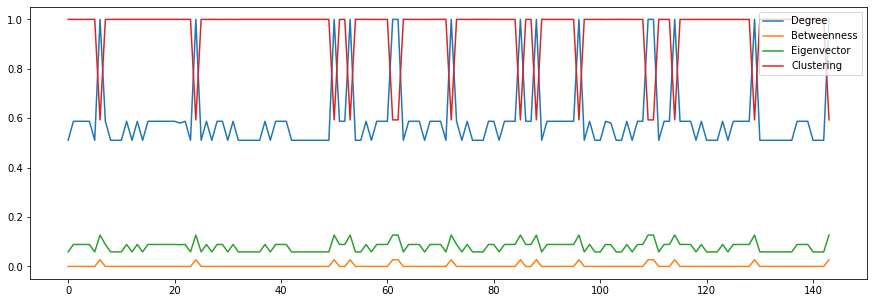

In [18]:
diccionario = nx.degree_centrality(G2)
d = np.array([diccionario[i] for i in G2])

#diccionario = nx.closeness_centrality(G2)
#c = np.array([diccionario[i] for i in G2])

diccionario = nx.betweenness_centrality(G2)
b = np.array([diccionario[i] for i in G2])

diccionario = nx.eigenvector_centrality(G2)
e = np.array([diccionario[i] for i in G2])

diccionario = nx.clustering(G2)
f = np.array([diccionario[i] for i in G2])

plt.figure(figsize = [15, 5])
plt.plot(d, label = 'Degree')
#plt.plot(c, label = 'Closeness')
plt.plot(b, label = 'Betweenness')
plt.plot(e, label = 'Eigenvector')
plt.plot(f, label = 'Clustering')


plt.legend()

Con el gráfico podemos identificar ciertos patrones interesantes, por ejemplo, todas la gráficas tienen ''picos'' en 15 valores y todas en el mismo nodo. Como primera observación, y fijándonos en el valor de la centralidad de grado, podemos identificar a los saltos en la gráfica como aquellos nodos que se encuentran en el centro de la red. La conclusión anterior se respalda del hecho que los nodos centrales se encuentran entre ambas comunidades lo que les permite tener un número mayor de enlaces.

Por otra parte, cuando revisamos el valor del clustering -$\color{red}{\text{Clustering}}$- de los nodos tenemos un fenómeno similar; encontramos un valor muy alto y casi constante $C = 1.0$ que nos habla de cuan conectadas se encuentran las comunidades. Sin embargo, notamos variaciones en los nodos centrales y aledaños; como los nodos centrales conectan ambas comunidades, los vecinos nunca se conectarán entre ellos pues son el único puente y, en consecuencia, decrece el valor de clustering de ellos.

Si consideramos las gráficas y recordamos lo que expresan estas medidas concluimos que:

1. El valor de clustering se relaciona con el de la centralidad de betweenness debido a que ambas intrínsecamente nos hablan de cómo se encuentran conectados los vecinos de un nodo.

2. Se relacionan la centralidad de grado y de eigenvector por su naturaleza dependiente del grado de cada nodo, el conectarse a muchos nodos le otorga el valor para conexiones con gran importancia.

Las anteriores observaciones se traducen en:

* $\color{red}{\text{Clustering}}$-$\color{orange}{\text{Betweenness}}$. Dado que en su gran mayoría los nodos se encuentran conectados como una gráfica completa se tendra un clustering alto pero betweenness baja porque las geodésicas serán enlaces directos. Además, las únicas variaciones posibles serán en nodos centrales.

Lo anterior, en términos de la red, nos habla sobre un aspecto de los crímenes: las locaciones de las comunidades comparten tipos de crímenes debido a aspectos intrínsecos a ellas. Dichas características pueden ser la poca vigilancia, las desigualdad de riqueza, la poca afluencia de transeúntes o lo apartado que se encuentra de la población. __Generando la conclusión indirecta que, ciertos delitos son más favorables dependiendo de la planeación urbana y la mobilidad de un lugar.__

* $\color{blue}{\text{Degree}}$-$\color{green}{\text{Eigenvector}}$. Como la manera principal en la que un nodo adquiere centralidad en ambos métodos es mediante enlazarse a muchos nodos, el comportamiento de las gráficas será completamente análogo sólo que podemos notar que para la centralidad de Eigenvector resultan más modulados los cambios.

De las visualizaciones adquiridas en este caso sólo podemos afirmar que, en cuanto a crímenes refiere, __ningún lugar queda excepto de que ocurra un crimen ahí sólo que hay ciertos lugares que destacan más que otros debido a características varias__: horas inactivas, menos vigilancia, el tiempo que se pasa ahí, entre otras.

### 4.2 Distribución de grado

Por otra parte, la distribución de grado podría decirnos cosas acerca de la red. No obstante, si revisamos la gráfica, rápidamente notamos que la distribución de grado tendrá una concentración en ciertos valores altos debido a que se encuentra muy conectada. Para corroborar los grados hagamos un diccionario y veamos los valores

In [19]:
diccionario = dict(G2.degree)
grados = [ diccionario[i] for i in G2]


distribucion = {}

for i in grados: #este bucle únicamente genera las claves del diccionario, asignándoles un valor de 0
    distribucion[i] = 0

for i in grados: #este bucle recorre todos los grados y cada vez que un valor aparece, suma uno a la cuenta de ese valor
    distribucion[i] += 1

distribucion

{73: 59, 84: 68, 143: 15, 83: 2}

Sólo existen 4 grados en toda la gráfica: 73, 143, 83 y 84. Ello no dice mucho, sin embargo, recordemos que cada lugar tiene un enlace si comparten un tipo de crimen, entonces tiene sentido resaltar que volvemos a confirmar que podemos separar en tres grupos según el tipo de delito que facilita dicha ubicación.

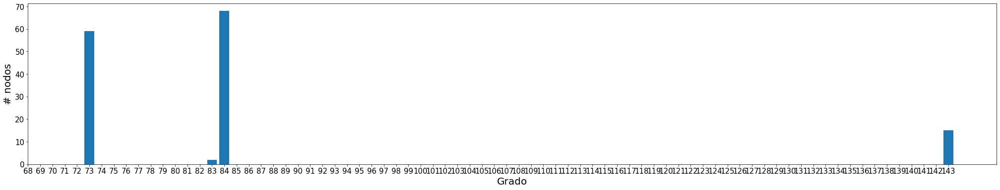

In [20]:
X = distribucion.keys()
Y = distribucion.values()

plt.figure(figsize = [35, 6])

plt.bar(X,Y)

plt.xlabel('Grado', size = 20)
plt.ylabel('# nodos', size = 20)
plt.xticks(ticks = range(min(X)-5,max(X)+1),labels = range(min(X)-5,max(X)+1), size = 15)
plt.yticks(size = 15)
plt.show()

Dada la distribución de grado, no parece ninguna de las vistas en clase.

## 5. Caminata aleatoria

Ahora implementaremos un algortimo de caminata aleatoria para los datos en la red. Dado que no tiene un significado en sí, elegiremos usar la ciudad de Chicago como red donde cada nodo será la interesección de dos vialidades o calles. Para ello ocuparemos la paquetería ox

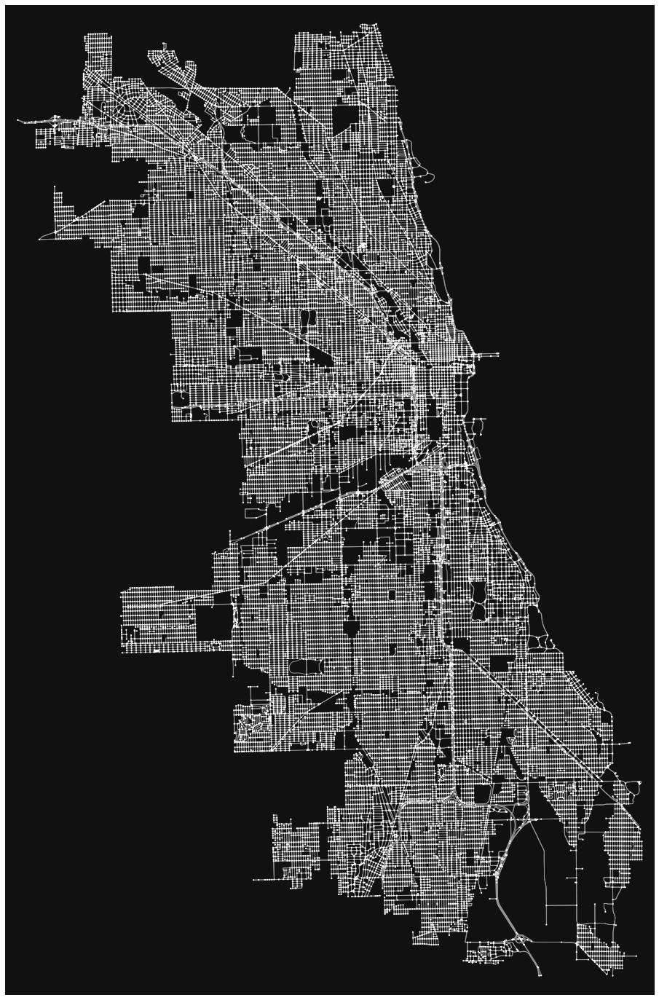

In [21]:
Chicago = ox.graph_from_place("Chicago, Illinois, USA", network_type="drive")
fig, ax = ox.plot_graph(Chicago, figsize = [25, 25], node_size = 5)

Teniendo la ciudad como una gráfica (red) podemos trabajar sobre los nodos y enlaces

In [22]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(Chicago)
gdf_nodes.head()

,y,x,street_count,ref,highway,geometry
osmid,,,,,,
701660,41.983951,-87.849198,3,NaN,NaN,POINT (-87.84920 41.98395)
702090,41.983432,-87.817823,3,80,motorway_junction,POINT (-87.81782 41.98343)
25779161,41.900902,-87.660921,3,NaN,NaN,POINT (-87.66092 41.90090)
25779173,41.895018,-87.657114,3,50B,motorway_junction,POINT (-87.65711 41.89502)
25779174,41.894301,-87.655976,3,NaN,NaN,POINT (-87.65598 41.89430)


In [23]:
import secrets

In [25]:
nodo_aleatorio = gdf_nodes.sample().index.item()

X = []
Y = []

pasos = 100
for p in range(pasos):
    nodo_aleatorio = secrets.choice( [i for i in Chicago.neighbors(nodo_aleatorio) ] )
    X.append( gdf_nodes.loc[nodo_aleatorio]['x'] )
    Y.append( gdf_nodes.loc[nodo_aleatorio]['y'] )

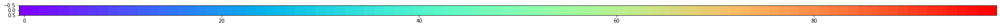

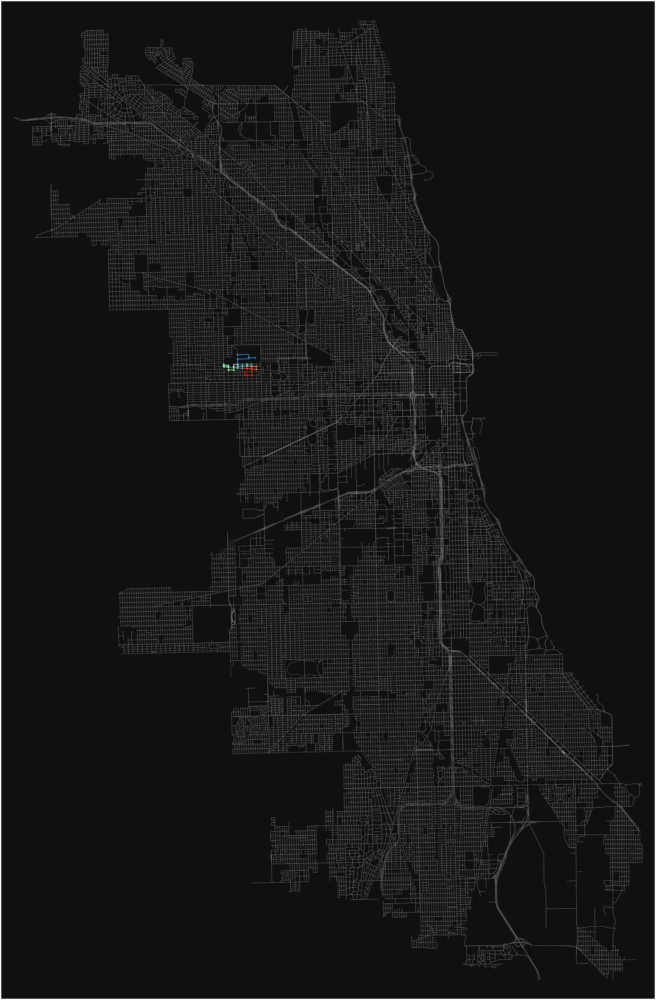

In [26]:
G3 = ox.speed.add_edge_speeds(Chicago)
G3 = ox.speed.add_edge_travel_times(Chicago)


routes = []

for i in range(pasos-1):
    orig = ox.distance.nearest_nodes(G3, X=X[i], Y=Y[i])
    dest = ox.distance.nearest_nodes(G3, X=X[i + 1], Y=Y[i + 1])
    route = ox.shortest_path(G3, orig, dest, weight="travel_time")
    routes.append(route)
    
plt.figure(figsize = [35, 6])

colores_map = [np.linspace(0,1,len(routes))]
plt.imshow(colores_map, cmap = 'rainbow')

    
colores = []

color = np.linspace(0,1, num = len(routes))
for i in color:
    colores.append(matplotlib.colors.rgb2hex(cm.rainbow(i)))
    
colores    
    
fig, ax = ox.plot_graph_routes(G3, routes, route_colors= colores,
                               figsize = [100, 100], route_linewidth=0.1, node_size=0)

También, por mera, curiosidad podemos marcar el mismo proceso a la red que analizamos

In [73]:
nodo_aleatorio_G2 = secrets.choice( list(G2.nodes()) ) 

X_G2 = []
Y_G2 = []

pasos = 10
X_G2.append( nodo_aleatorio_G2 )

for p in range(pasos):
    nodo_aleatorio = secrets.choice( [i for i in G2.neighbors(nodo_aleatorio_G2) ] )
    X_G2.append( nodo_aleatorio )
    Y_G2.append( nodo_aleatorio )

caminata = nx.Graph()

caminata.add_nodes_from( set(X_G2 + Y_G2) ) 
caminata.add_edges_from( zip(X_G2[:-1],Y_G2) )

nombres = dict()

j = 1

for i in X_G2:
    nombres[i] = j
    j = j + 1

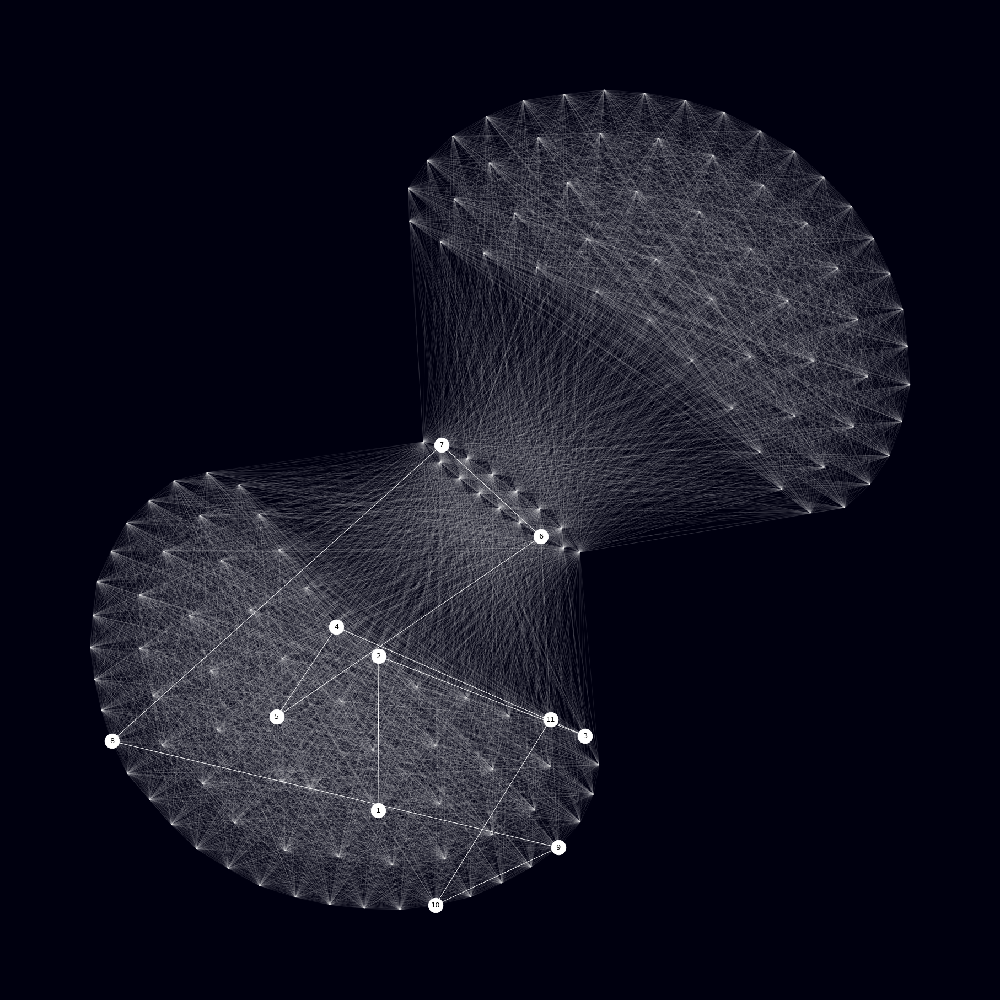

In [85]:
fig = plt.figure(figsize = [25,25])

nx.draw_kamada_kawai(G2, node_size = 0, edge_color = 'white', alpha = 0.1)

nx.drawing.nx_pylab.draw_networkx_nodes(caminata, pos = nx.kamada_kawai_layout(G2), 
                                        node_size = 700, node_color= "white", 
                                        cmap = 'cool') # Colocamos los nodos

nx.drawing.nx_pylab.draw_networkx_labels(caminata, labels = nombres, pos = nx.kamada_kawai_layout(G2),
                                         font_size = 13, font_color="k") # Colocamos los enlaces

nx.drawing.nx_pylab.draw_networkx_edges(caminata, edge_color = 'white',
                                        pos = nx.kamada_kawai_layout(G2) ) # Colocamos los enlaces

fig.set_facecolor("#00000F")



## 6. Sobre el trabajo.

Observamos dos redes posibles para visualizar la base de datos y extraer información de ella: como primer red analizamos los crímenes según la ubicación precisa en la ciudad (cuadra) y como segunda red analizamos los tipos de locaciones en una ciudad. 

En el primer caso se observó que el considerar una región cualquiera de la ciudad puede considerarse como una representación más pequeña de toda el área ya que repite los patrones de crímenes lo cual se sustenta en que prácticamentela red es completa. Por otro lado, la segunda red nos permitió notar que, en términos de crímenes, podemos separar a la ciudad en grandes apartados que permiten clasificar a los lugares

### 6.1 Otros tipos de redes

Es claro que podemos hallar otros tipos de análisis y criterios para construir las redes a analizar, valdría la pena agregar una componente temporal o un criterio para la formación de enlaces según la repetición o la hora en que se cometió. Como propuesta concreta de otros análisis podemos centrarnos en las colonias y el la hora del día que ocurre cierto crimen o simplemente horas y crímenes.

### 6.2 Alcance del proyecto

Cuando analizamos las horas de ocurrencia de los crímenes podemos notar cierta distribución que nos hablará intrínsecamente que estrategias pueden desarrollarse en una ciudad para mejorar la seguridad de un lugar. Extrapolando este comportamiento, es posible crear una forma eficaz de patrullaje o vigilancia para una mejor y más oportuna respuesta y prevención a delitos pero que incluso no se limite a ello sino a la prevención de accidentes.

# /ᐠ. ｡.ᐟ\ᵐᵉᵒʷˎˊ˗

### Otra cosa

In [ ]:
df_dict = {cuadra: df[df['Location Description'] == cuadra] for cuadra in df['Location Description'].unique()}
#df.Block.unique()

In [ ]:
print(df_dict)